In [1]:
from tensorflow.keras import layers, Input, Model
from tensorflow.keras import optimizers, losses
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [2]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, :w, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, w:, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)


## $\bullet$ 이미지 Augmentation
### 도로는 좌우만

In [3]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    # out = image.random_flip_up_down(out)
    
    # if tf.random.uniform(()) < .5:
    #     degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
    #     out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

✅


### 위에서 봤듯이 스케치와 완성 사진이 같이 붙어있으므로, 그 결과를 얻는 함수를 만들어줍니다.

In [4]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored


### 이제 Unet의 구조로 Generator를 만들것입니다!!

In [5]:
from tensorflow.keras import layers, Input, Model

In [6]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

✅


In [7]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


In [8]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[0][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[0][0]             
______________________________________________________________________________________________

In [9]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


In [10]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


In [11]:
Discriminator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_2[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

![image](data/refer_d.max-800x600.png)

### 이런 모습입니다.
### 아래와 같이 인풋을 넣으면, (30,30,1)의 출력이 나오는 것을 볼 수 있습니다.

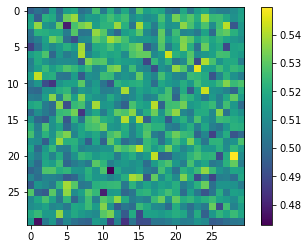

In [12]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

In [13]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


In [14]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


In [15]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


In [16]:
import os

train_path = os.getenv('HOME')+'/aiffel/conditional_generation/data/cityscapes/train/'
val_path = os.getenv('HOME')+'/aiffel/conditional_generation/data/cityscapes/val/'

print("number of train examples :", len(os.listdir(train_path)), "number of train examples :", len(os.listdir(val_path)))

number of train examples : 1000 number of train examples : 5


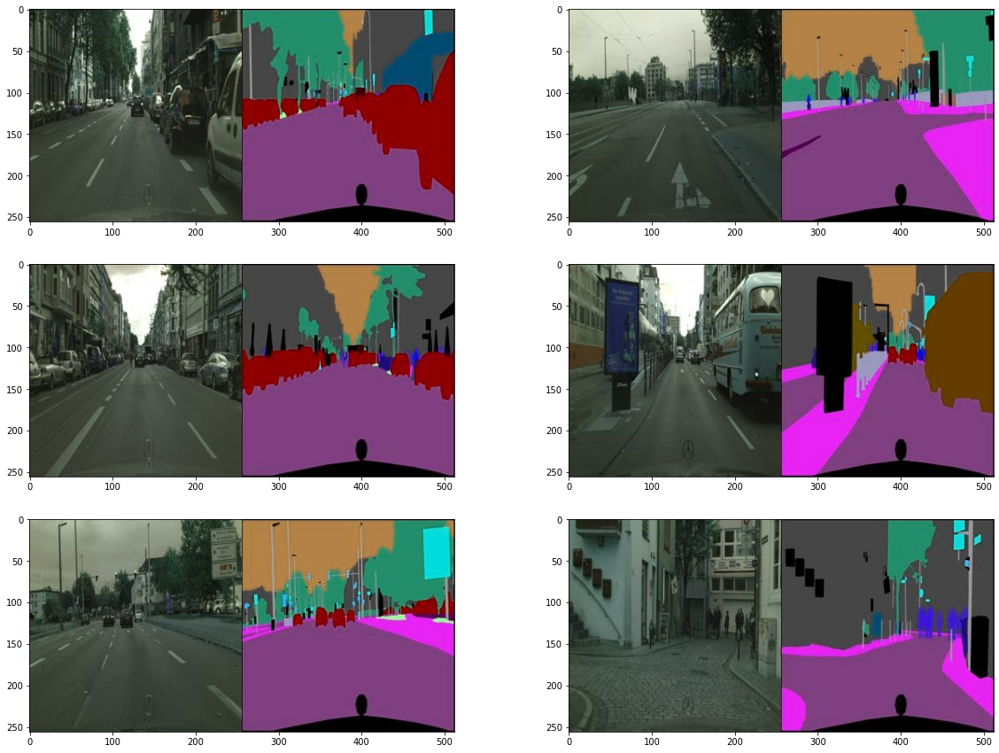

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = train_path + os.listdir(train_path)[np.random.randint(1000)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

In [18]:
f = train_path + os.listdir(train_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


### 위에서 만든 함수들을 가져다 쓰겠습니다.


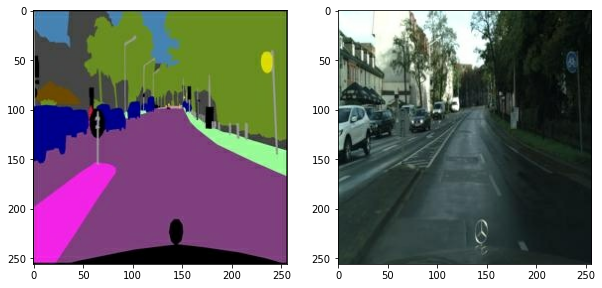

In [19]:
f = train_path + os.listdir(train_path)[1]
real, segmented = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(segmented))
plt.subplot(1,2,2); plt.imshow(denormalize(real))

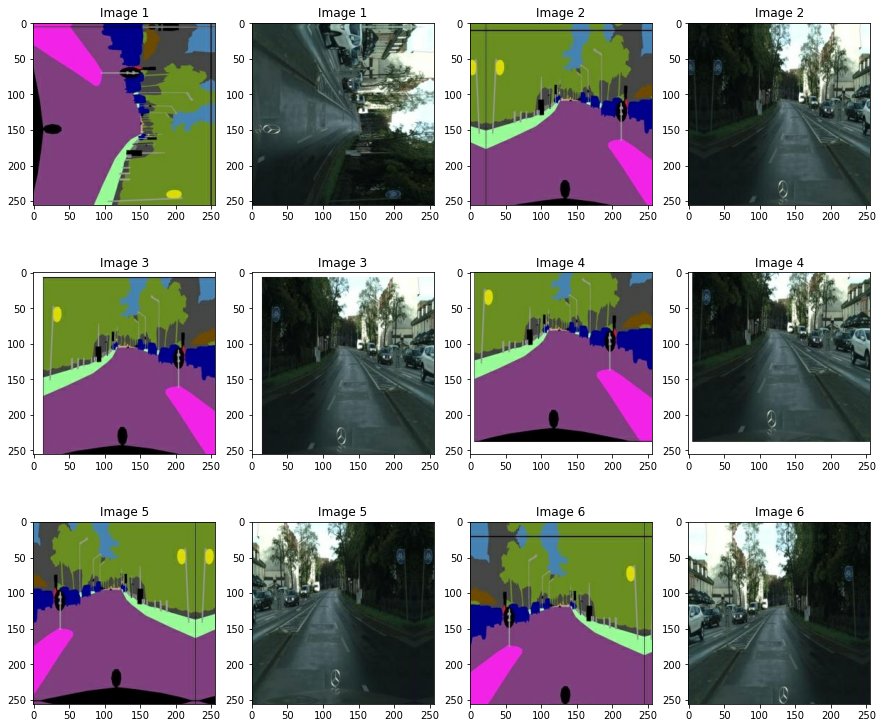

In [29]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_seg, augmented_real = apply_augmentation(segmented, real)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_seg)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_real)); plt.title(f"Image {img_n}")
    img_n += 1

## 원래 위와 같았던 것을!!

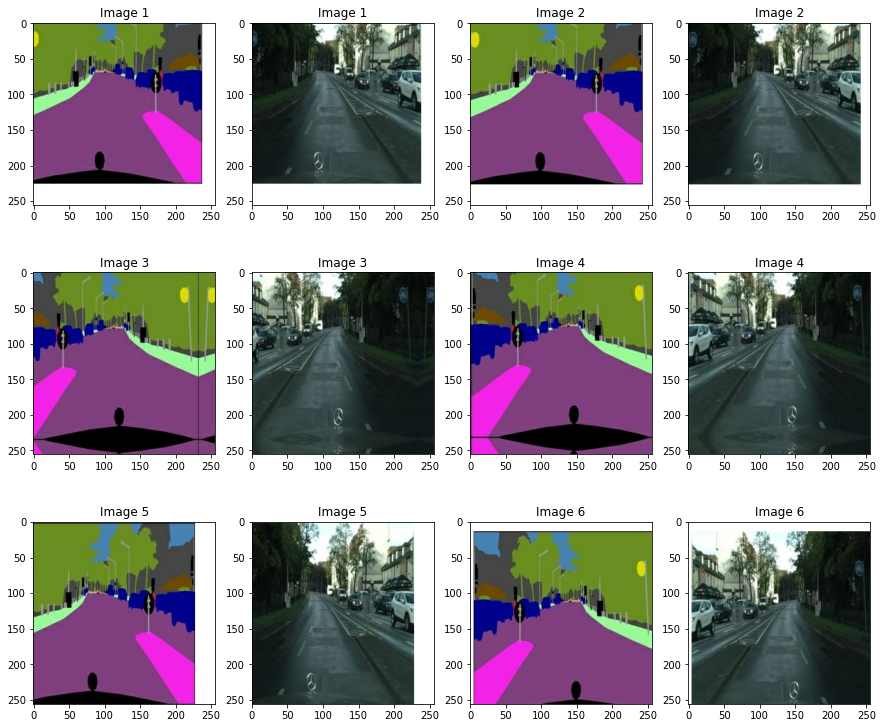

In [20]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_seg, augmented_real = apply_augmentation(segmented, real)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_seg)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_real)); plt.title(f"Image {img_n}")
    img_n += 1

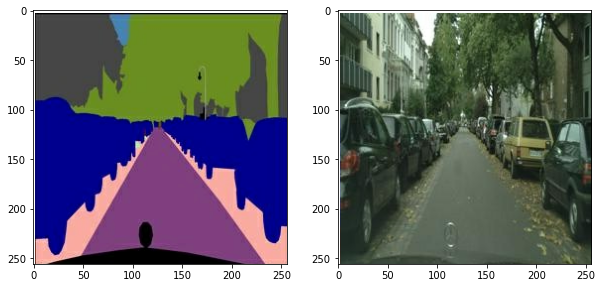

In [21]:
from tensorflow import data

def get_train(img_path):
    real, seg = load_img(img_path)
    real, seg = apply_augmentation(real, seg)
    return seg, real

train_images = data.Dataset.list_files(train_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
seg, real = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(seg[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(real[0].astype(np.uint8))

In [22]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")


EPOCHS = 200 #약 01:30 정도 소요 됩니다....!

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (seg, real) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(seg, real)
                
        # 100회 반복마다 손실을 출력합니다.
        if (i+1) % 125 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

✅
EPOCH[1] - STEP[125]                     
Generator_loss:0.9524                     
L1_loss:0.1877                     
Discriminator_loss:0.9588

EPOCH[1] - STEP[250]                     
Generator_loss:0.8624                     
L1_loss:0.1637                     
Discriminator_loss:0.7512

EPOCH[2] - STEP[125]                     
Generator_loss:2.0193                     
L1_loss:0.1784                     
Discriminator_loss:0.6757

EPOCH[2] - STEP[250]                     
Generator_loss:2.1737                     
L1_loss:0.1988                     
Discriminator_loss:0.9514

EPOCH[3] - STEP[125]                     
Generator_loss:1.9717                     
L1_loss:0.1554                     
Discriminator_loss:1.4157

EPOCH[3] - STEP[250]                     
Generator_loss:0.6883                     
L1_loss:0.1477                     
Discriminator_loss:1.3982

EPOCH[4] - STEP[125]                     
Generator_loss:1.4997                     
L1_loss:0.1710           

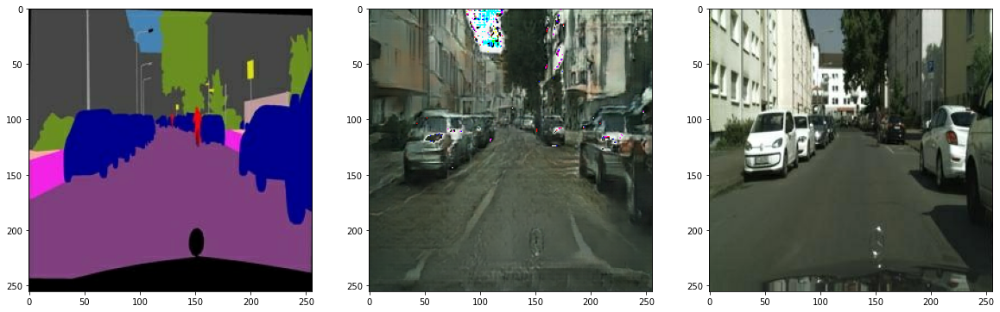

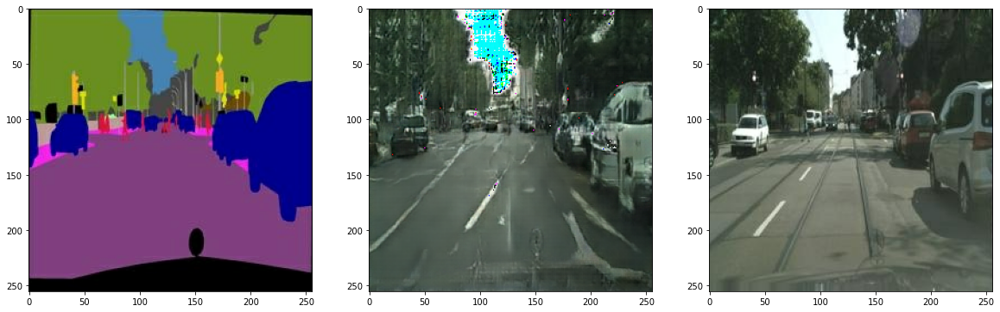

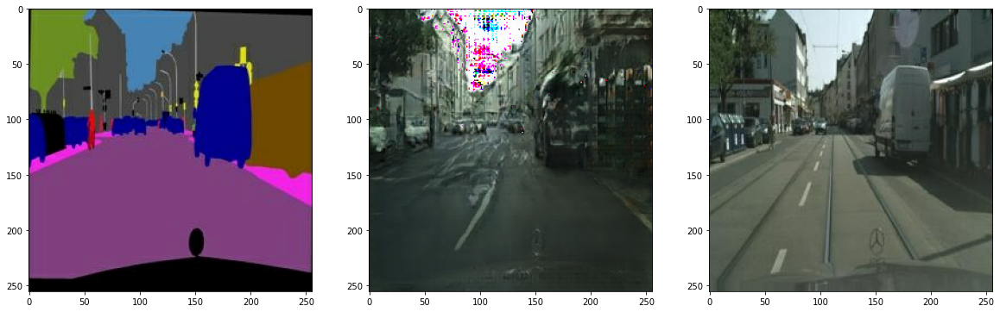

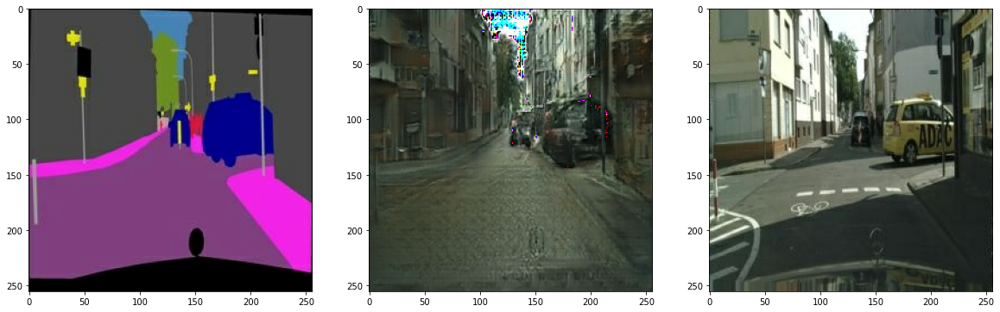

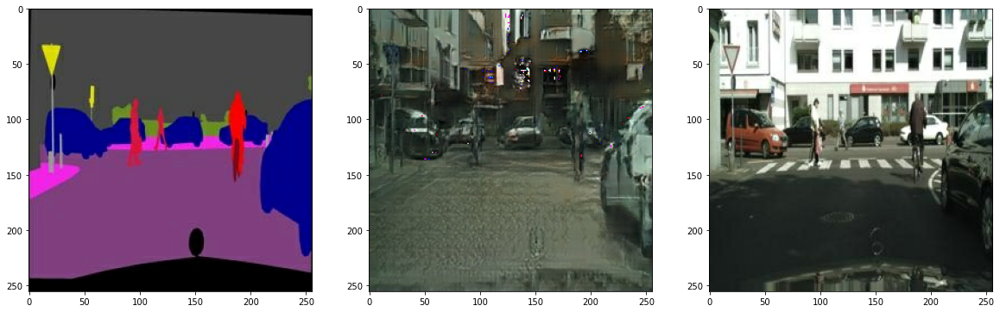

In [23]:
test_list = [0,1,2,3,4]


for test_ind in test_list:
    f = val_path + os.listdir(val_path)[test_ind]
    real_val, seg_val = load_img(f)

    pred = generator(tf.expand_dims(seg_val, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,50))
    plt.subplot(5,3,3*test_ind+1); plt.imshow(denormalize(seg_val))
    plt.subplot(5,3,3*test_ind+2); plt.imshow(pred[0])
    plt.subplot(5,3,3*test_ind+3); plt.imshow(denormalize(real_val))
plt.show()

In [24]:
checkpoint_dir = "/aiffel/aiffel/conditional_generation/data/model"

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt_more")
checkpoint = tf.train.Checkpoint(gene_opt=gene_opt,
                                 disc_opt=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

checkpoint.save(file_prefix=checkpoint_prefix)




'/aiffel/aiffel/conditional_generation/data/model/ckpt_more-1'

### 좀 많이 안예쁘군요! 오히려 처음이 나은 것 같습니다... 100회만 더 해보겠습니다!

In [25]:
gene_opt = optimizers.Adam(1e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(1e-4, beta_1=.5, beta_2=.999)


EPOCHS = 100 #약 00:10 정도 소요 될 것 같습니다....!

for epoch in range(1, EPOCHS+1):
    for i, (seg, real) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(seg, real)
                
        # 125회 반복마다 손실을 출력합니다.
        if (i+1) % 125 == 0:
            print(f"EPOCH[{epoch+200}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[201] - STEP[125]                     
Generator_loss:1.4979                     
L1_loss:0.1223                     
Discriminator_loss:1.3090

EPOCH[201] - STEP[250]                     
Generator_loss:1.8114                     
L1_loss:0.1341                     
Discriminator_loss:0.9517

EPOCH[202] - STEP[125]                     
Generator_loss:1.1684                     
L1_loss:0.1279                     
Discriminator_loss:0.7673

EPOCH[202] - STEP[250]                     
Generator_loss:0.8357                     
L1_loss:0.1366                     
Discriminator_loss:1.0196

EPOCH[203] - STEP[125]                     
Generator_loss:3.1123                     
L1_loss:0.1452                     
Discriminator_loss:1.2294

EPOCH[203] - STEP[250]                     
Generator_loss:0.7938                     
L1_loss:0.1334                     
Discriminator_loss:1.1965

EPOCH[204] - STEP[125]                     
Generator_loss:1.1773                     
L1_loss:0.125

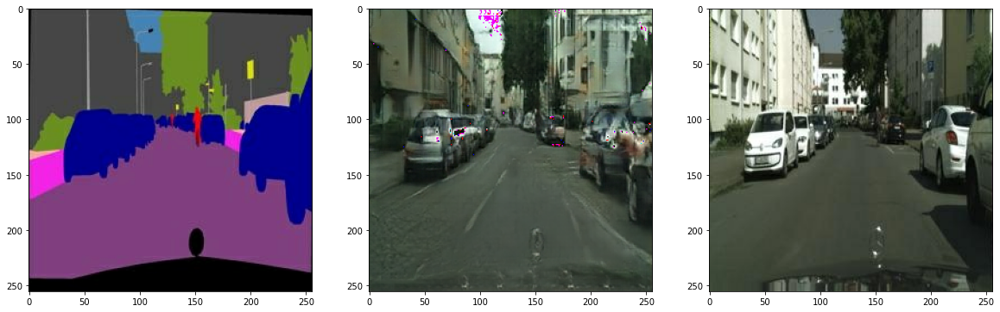

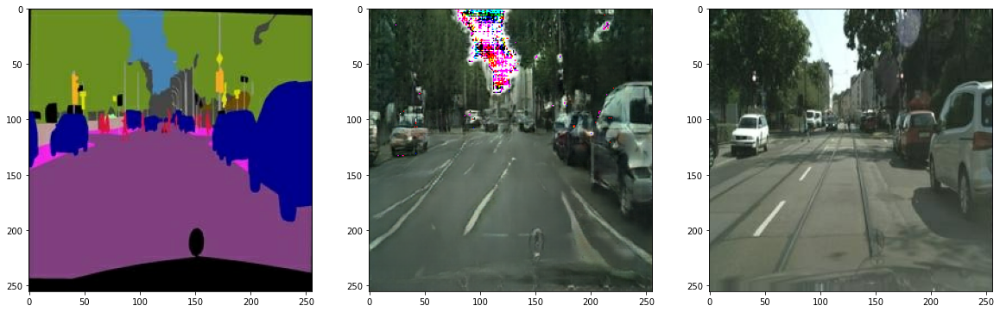

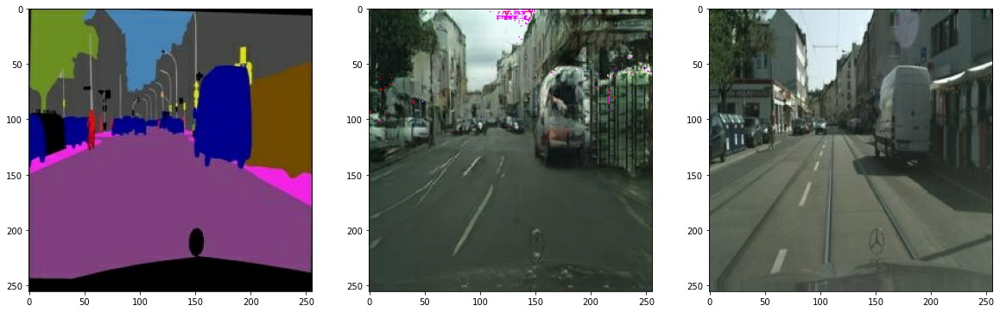

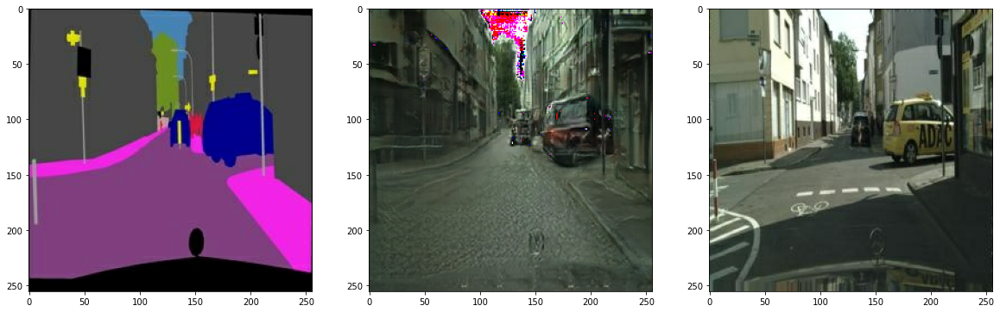

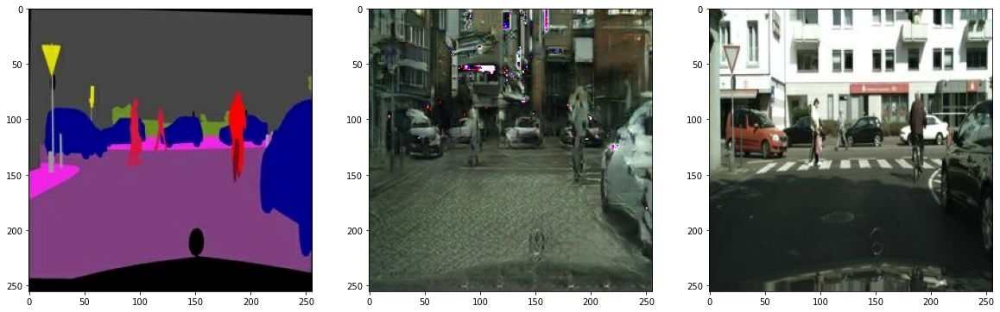

In [26]:
test_list = [0,1,2,3,4]


for test_ind in test_list:
    f = val_path + os.listdir(val_path)[test_ind]
    real_val, seg_val = load_img(f)

    pred = generator(tf.expand_dims(seg_val, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,50))
    plt.subplot(5,3,3*test_ind+1); plt.imshow(denormalize(seg_val))
    plt.subplot(5,3,3*test_ind+2); plt.imshow(pred[0])
    plt.subplot(5,3,3*test_ind+3); plt.imshow(denormalize(real_val))
plt.show()

### !! 그럭저럭 볼만해 졌습니다.
### 100번만... 더 해볼까요?? 일단 현재 파라미터들을 저장하는게 바람직할 것 같습니다.


In [27]:
checkpoint_dir = "/aiffel/aiffel/conditional_generation/data/model"

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt_more")
checkpoint = tf.train.Checkpoint(gene_opt=gene_opt,
                                 disc_opt=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

checkpoint.save(file_prefix=checkpoint_prefix)




'/aiffel/aiffel/conditional_generation/data/model/ckpt_more-1'

```python
checkpoint_dir = "/aiffel/aiffel/conditional_generation/data/model"
latest = tf.train.latest_checkpoint(checkpoint_dir)
generator = UNetGenerator()
discriminator = Discriminator()
checkpoint = tf.train.Checkpoint(gene_opt=gene_opt,
                                 disc_opt=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator
gene_opt = checkpoint.gene_opt
disc_opt = checkpoint.disc_opt
```
### 아마 이렇게 불러 쓸 수 있을 것 같아요.

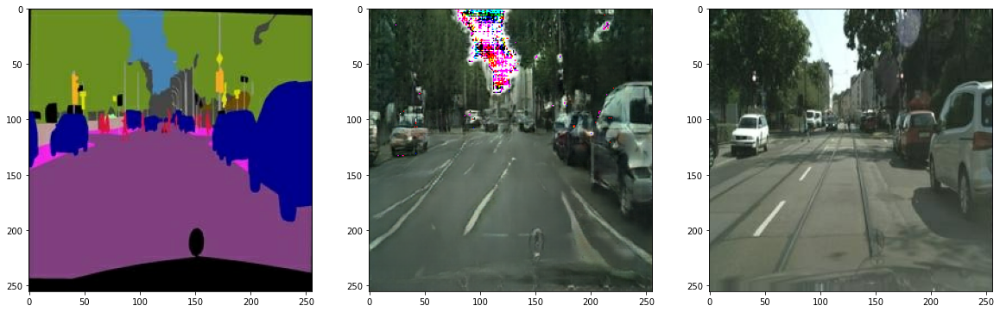

In [27]:
checkpoint_dir = "/aiffel/aiffel/conditional_generation/data/model"
latest = tf.train.latest_checkpoint(checkpoint_dir)
generator = UNetGenerator()
discriminator = Discriminator()
checkpoint = tf.train.Checkpoint(gene_opt=gene_opt,
                                 disc_opt=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator
gene_opt = checkpoint.gene_opt
disc_opt = checkpoint.disc_opt

# 잘 불러왔는지 하나만 출력해보겠습니다.
test_ind = 1
f = val_path + os.listdir(val_path)[test_ind]
real_val, seg_val = load_img(f)

pred = generator(tf.expand_dims(seg_val, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(seg_val))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(real_val))

### 이걸 또 제가 해내는군요ㅋㅋ 이어서 학습합니다.

In [28]:

EPOCHS = 100 #약 03:30 정도 소요 될 것 같습니다....!

for epoch in range(1, EPOCHS+1):
    for i, (seg, real) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(seg, real)
                
        # 125회 반복마다 손실을 출력합니다.
        if (i+1) % 250 == 0:
            print(f"EPOCH[{epoch+300}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[301] - STEP[250]                     
Generator_loss:2.3257                     
L1_loss:0.1471                     
Discriminator_loss:0.7292

EPOCH[302] - STEP[250]                     
Generator_loss:1.5808                     
L1_loss:0.1394                     
Discriminator_loss:0.5690

EPOCH[303] - STEP[250]                     
Generator_loss:2.2038                     
L1_loss:0.1290                     
Discriminator_loss:0.6966

EPOCH[304] - STEP[250]                     
Generator_loss:0.8669                     
L1_loss:0.1289                     
Discriminator_loss:0.8716

EPOCH[305] - STEP[250]                     
Generator_loss:1.4834                     
L1_loss:0.1450                     
Discriminator_loss:0.5417

EPOCH[306] - STEP[250]                     
Generator_loss:1.4926                     
L1_loss:0.1216                     
Discriminator_loss:0.5953

EPOCH[307] - STEP[250]                     
Generator_loss:2.8252                     
L1_loss:0.116

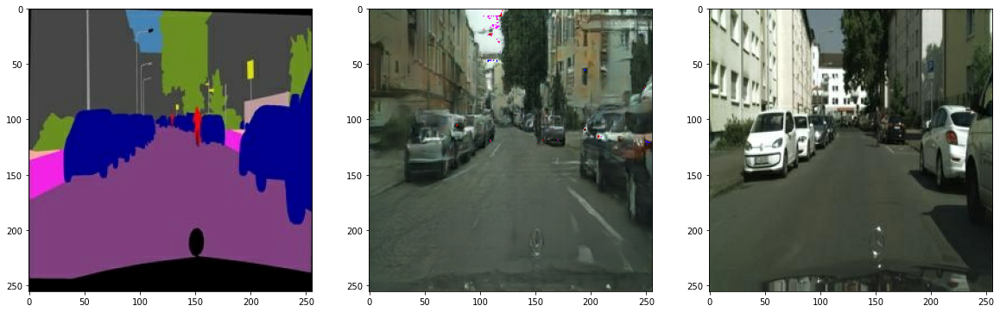

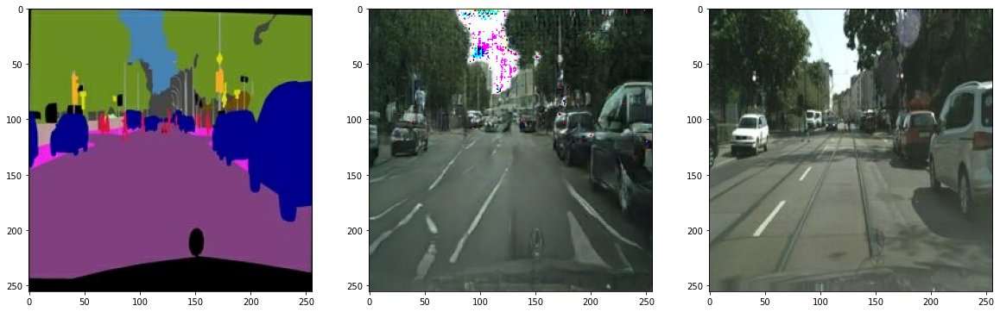

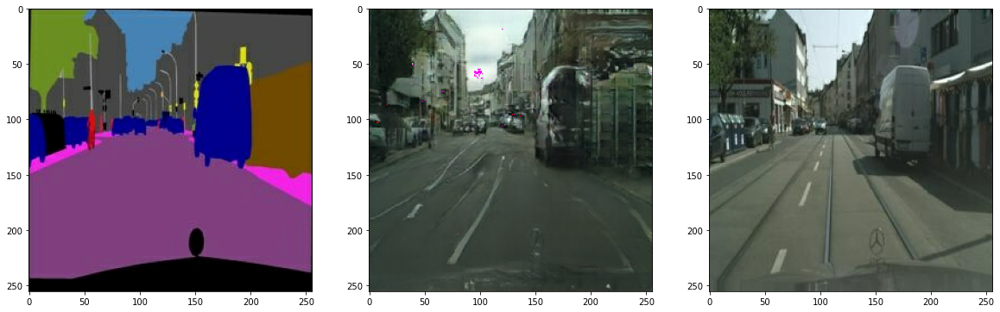

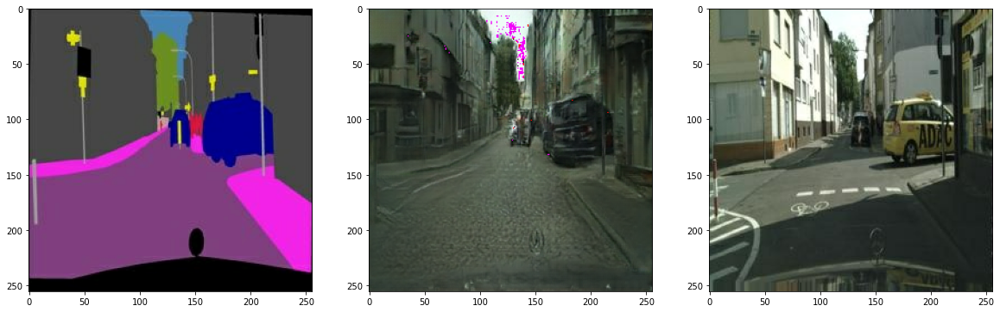

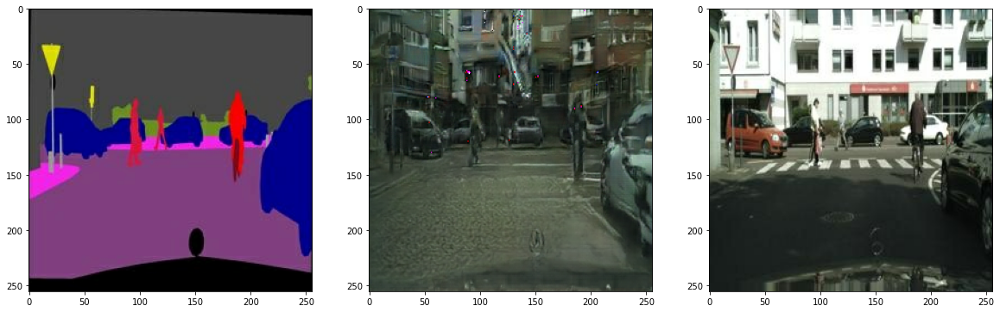

In [29]:
test_list = [0,1,2,3,4]


for test_ind in test_list:
    f = val_path + os.listdir(val_path)[test_ind]
    real_val, seg_val = load_img(f)

    pred = generator(tf.expand_dims(seg_val, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,50))
    plt.subplot(5,3,3*test_ind+1); plt.imshow(denormalize(seg_val))
    plt.subplot(5,3,3*test_ind+2); plt.imshow(pred[0])
    plt.subplot(5,3,3*test_ind+3); plt.imshow(denormalize(real_val))
plt.show()

In [30]:
checkpoint_dir = "/aiffel/aiffel/conditional_generation/data/model"

checkpoint_prefix = os.path.join(checkpoint_dir, "ckptmoremore")
checkpoint = tf.train.Checkpoint(gene_opt=gene_opt,
                                 disc_opt=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

checkpoint.save(file_prefix=checkpoint_prefix)


'/aiffel/aiffel/conditional_generation/data/model/ckptmoremore-1'

In [31]:
gene_opt = optimizers.Adam(5e-5, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(5e-5, beta_1=.5, beta_2=.999)


EPOCHS = 100 #약 01:30 정도 소요 될 것 같습니다....!

for epoch in range(1, EPOCHS+1):
    for i, (seg, real) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(seg, real)
                
        # 125회 반복마다 손실을 출력합니다.
        if (i+1) % 125 == 0:
            print(f"EPOCH[{epoch+400}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[401] - STEP[125]                     
Generator_loss:2.1165                     
L1_loss:0.1179                     
Discriminator_loss:0.6665

EPOCH[401] - STEP[250]                     
Generator_loss:1.2924                     
L1_loss:0.1116                     
Discriminator_loss:0.9505

EPOCH[402] - STEP[125]                     
Generator_loss:1.8973                     
L1_loss:0.1089                     
Discriminator_loss:0.7858

EPOCH[402] - STEP[250]                     
Generator_loss:1.9449                     
L1_loss:0.1236                     
Discriminator_loss:0.9454

EPOCH[403] - STEP[125]                     
Generator_loss:2.8070                     
L1_loss:0.1206                     
Discriminator_loss:0.5556

EPOCH[403] - STEP[250]                     
Generator_loss:0.8946                     
L1_loss:0.1099                     
Discriminator_loss:1.0930

EPOCH[404] - STEP[125]                     
Generator_loss:2.7891                     
L1_loss:0.126

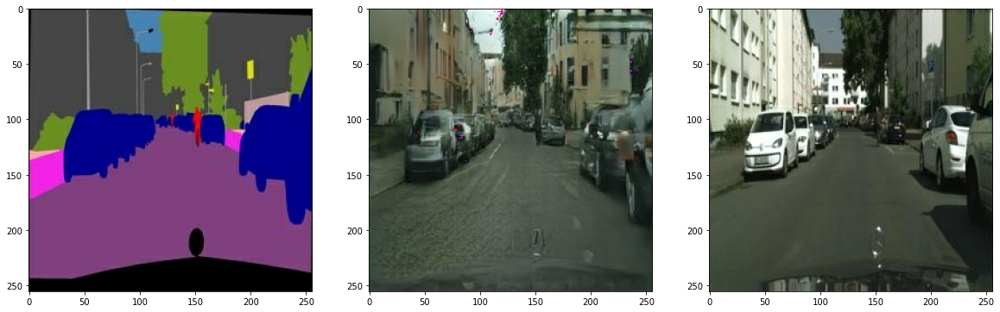

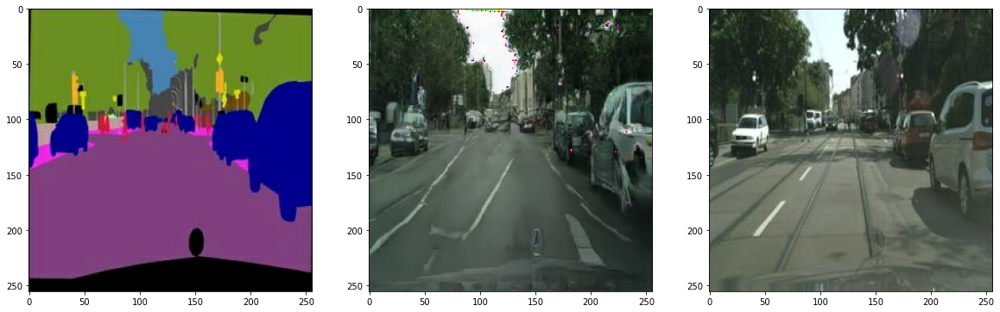

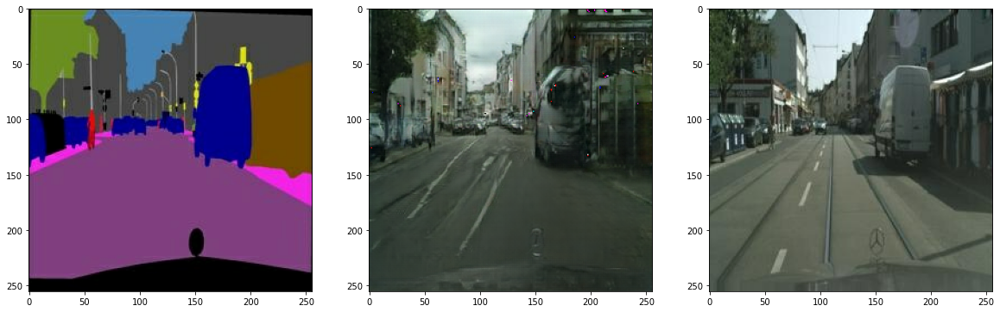

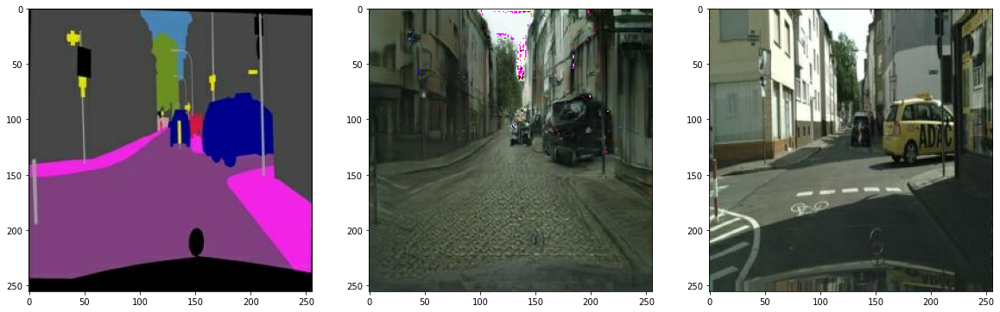

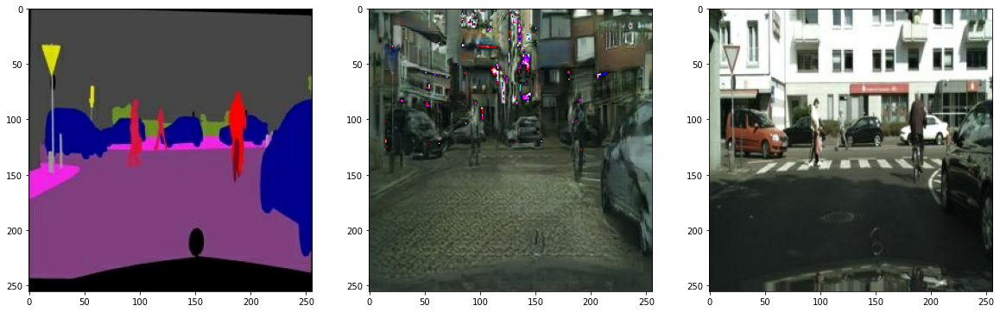

In [32]:
test_list = [0,1,2,3,4]


for test_ind in test_list:
    f = val_path + os.listdir(val_path)[test_ind]
    real_val, seg_val = load_img(f)

    pred = generator(tf.expand_dims(seg_val, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,50))
    plt.subplot(5,3,3*test_ind+1); plt.imshow(denormalize(seg_val))
    plt.subplot(5,3,3*test_ind+2); plt.imshow(pred[0])
    plt.subplot(5,3,3*test_ind+3); plt.imshow(denormalize(real_val))
plt.show()

In [33]:
checkpoint_dir = "/aiffel/aiffel/conditional_generation/data/model"

checkpoint_prefix = os.path.join(checkpoint_dir, "ckptmorefinal")
checkpoint = tf.train.Checkpoint(gene_opt=gene_opt,
                                 disc_opt=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

checkpoint.save(file_prefix=checkpoint_prefix)


'/aiffel/aiffel/conditional_generation/data/model/ckptmorefinal-1'

# 4. 아쉬운 점<br>
## 1) 세그멘테이션을 직접 구현해보지 않고, 그 반대단계 격인, 세그멘테이션을 원본 사진처럼 만들기를 하니, 깔끔하게 이해되지 않는 아쉬움이 있습니다. 빨리 세그멘테이션을 해보고싶군요!

## 2) 이제 CV, NLP 선택에서 NLP를 향해 가는데, CV를 이만큼만 알고 있어도 되는 것인가... 하는 탄식이 이네요ㅋㅋ 역시 혼자서 공부 해야하는 거겠죠?